# Problem 1 - S&P 500 

In [1]:
import pandas as pd
file_path= 'C:/Users/jaswa/OneDrive/Desktop/733/Home Work 3/SP500_ticker.csv'
df = pd.read_csv(file_path, encoding='ISO-8859-1')
df.head()

,ticker,company_name,sector
0,MMM,3M Co.,Industrials
1,ACE,ACE Limited,Financials
2,ABT,Abbott Laboratories,Health Care
3,ANF,Abercrombie & Fitch Company A,Consumer Discretionary
4,ADBE,Adobe Systems Inc,Information Technology


In [2]:
file_path= 'C:/Users/jaswa/OneDrive/Desktop/733/Home Work 3/SP500_close_price_no_missing.csv'
df=pd.read_csv('C:/Users/jaswa/OneDrive/Desktop/733/Home Work 3/SP500_close_price_no_missing.csv')
df.head()

,date,MMM,ACE,ABT,ANF,ADBE,AMD,AES,AET,AFL,...,WYN,WYNN,XEL,XRX,XLNX,XL,YHOO,YUM,ZMH,ZION
0,2011-01-03,86.79,62.24,47.82,58.03,31.29,8.47,12.54,31.04,57.54,...,30.67,108.99,23.56,11.71,29.42,22.16,16.75,49.09,54.97,25.17
1,2011-01-04,86.67,62.20,48.27,56.22,31.51,8.77,12.60,31.20,56.49,...,30.48,112.39,23.66,11.40,29.54,22.05,16.59,48.34,54.24,24.76
2,2011-01-05,86.67,61.99,48.27,55.35,32.22,8.91,12.77,31.50,56.38,...,30.38,113.84,23.52,11.46,29.64,22.17,16.91,48.57,54.28,24.90
3,2011-01-06,86.14,61.72,48.17,53.53,32.27,8.69,12.99,32.09,56.07,...,29.94,114.67,23.50,11.46,30.14,22.16,17.06,48.91,52.60,24.83
4,2011-01-07,86.23,61.26,48.37,53.57,32.04,8.83,12.99,32.16,55.85,...,29.83,118.73,23.71,11.30,29.97,22.12,16.90,49.52,52.59,24.57


A)Fit a PCA model to log returns  (log return = log( Price [t+1]/Price [t]) derived from stock price data and complete the following tasks

In [5]:
import pandas as pd
import numpy as np  # Add this line
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Load the data
data = pd.read_csv("C:/Users/jaswa/OneDrive/Desktop/733/Home Work 3/SP500_close_price_no_missing.csv")
data['date'] = pd.to_datetime(data['date'])
data.set_index('date', inplace=True)

# Calculate log returns
log_returns = data.pct_change().apply(lambda x: np.log(1 + x))  # Now NumPy is defined

# Drop any rows with NaN values
log_returns = log_returns.dropna()

# Standardize the log returns
scaler = StandardScaler()
log_returns_scaled = scaler.fit_transform(log_returns)

# Apply PCA
num_components = 8  # You can choose the number of principal components
pca = PCA(n_components=num_components)
principal_components = pca.fit_transform(log_returns_scaled)

# Create a DataFrame with the principal components
pc_data = pd.DataFrame(data=principal_components, columns=[f'PC{i}' for i in range(1, num_components + 1)])

# Display the DataFrame with principal components
print(pc_data.head())


        PC1       PC2       PC3       PC4       PC5       PC6       PC7  \
0  7.511892  2.244149 -0.471785  1.392289 -2.104596 -8.595688 -0.615115   
1 -6.276643 -4.758079  1.555728  2.484411 -0.329695 -0.616826  0.964577   
2  3.950712 -1.353969  1.843473 -2.629881  0.173283 -6.885083  3.505825   
3  2.679768  0.302130 -3.716501 -1.975949  1.057718 -0.519226 -0.503253   
4  1.841507 -3.453061  0.527944 -2.309517  1.228782  0.555396 -0.400262   

        PC8  
0 -1.839029  
1  0.642222  
2 -0.947643  
3 -1.902458  
4  0.487358  


#A 1.Derive log returns from the raw stock price dataset

In [6]:
import numpy as np
file_path_ticker = 'C:/Users/jaswa/OneDrive/Desktop/733/Home Work 3/SP500_ticker.csv'
file_path_close_price = 'C:/Users/jaswa/OneDrive/Desktop/733/Home Work 3/SP500_close_price_no_missing.csv'
# Read the CSV files into pandas DataFrames
ticker_df = pd.read_csv(file_path_ticker, encoding='ISO-8859-1')
close_price_df = pd.read_csv(file_path_close_price)

# Display the first few rows of the close price dataset to understand its structure
print(close_price_df.head())

# Derive log returns from the raw stock price dataset
log_returns_df = close_price_df.copy()  # Create a copy to store log returns

# Calculate log returns for each stock
log_returns_df.iloc[:, 1:] = close_price_df.iloc[:, 1:].apply(lambda x: np.log(x) - np.log(x.shift(1)))

# Display the first few rows of the log returns dataset
print(log_returns_df.head())

# Now 'log_returns_df' contains log returns for each stock
# You can proceed with further analysis using these log returns

         date    MMM    ACE    ABT    ANF   ADBE   AMD    AES    AET    AFL  \
0  2011-01-03  86.79  62.24  47.82  58.03  31.29  8.47  12.54  31.04  57.54   
1  2011-01-04  86.67  62.20  48.27  56.22  31.51  8.77  12.60  31.20  56.49   
2  2011-01-05  86.67  61.99  48.27  55.35  32.22  8.91  12.77  31.50  56.38   
3  2011-01-06  86.14  61.72  48.17  53.53  32.27  8.69  12.99  32.09  56.07   
4  2011-01-07  86.23  61.26  48.37  53.57  32.04  8.83  12.99  32.16  55.85   

   ...    WYN    WYNN    XEL    XRX   XLNX     XL   YHOO    YUM    ZMH   ZION  
0  ...  30.67  108.99  23.56  11.71  29.42  22.16  16.75  49.09  54.97  25.17  
1  ...  30.48  112.39  23.66  11.40  29.54  22.05  16.59  48.34  54.24  24.76  
2  ...  30.38  113.84  23.52  11.46  29.64  22.17  16.91  48.57  54.28  24.90  
3  ...  29.94  114.67  23.50  11.46  30.14  22.16  17.06  48.91  52.60  24.83  
4  ...  29.83  118.73  23.71  11.30  29.97  22.12  16.90  49.52  52.59  24.57  

[5 rows x 472 columns]
         date       M

#A 2. Plot a scree plot which shows the distribution of variance contained in subsequent principal components sorted by their eigenvalues.


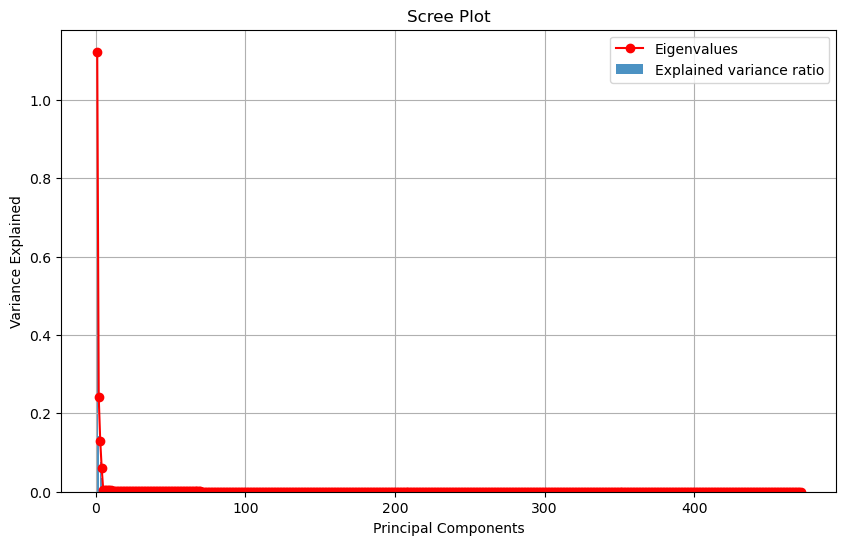

In [7]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Drop any rows with missing values if necessary
log_returns_df.dropna(inplace=True)

# Extract log returns for PCA
log_returns_values = log_returns_df.iloc[:, 1:].values  # Exclude date column for PCA

# Perform PCA
pca = PCA()
pca.fit(log_returns_values)

# Calculate the explained variance ratio and eigenvalues
explained_var_ratio = pca.explained_variance_ratio_
eigenvalues = pca.explained_variance_

# Plot the scree plot
plt.figure(figsize=(10, 6))
plt.bar(range(1, len(explained_var_ratio) + 1), explained_var_ratio, alpha=0.8, align='center',
        label='Explained variance ratio')
plt.plot(range(1, len(eigenvalues) + 1), eigenvalues, marker='o', color='red', label='Eigenvalues')

plt.xlabel('Principal Components')
plt.ylabel('Variance Explained')
plt.title('Scree Plot')
plt.legend()
plt.grid(True)
plt.show()



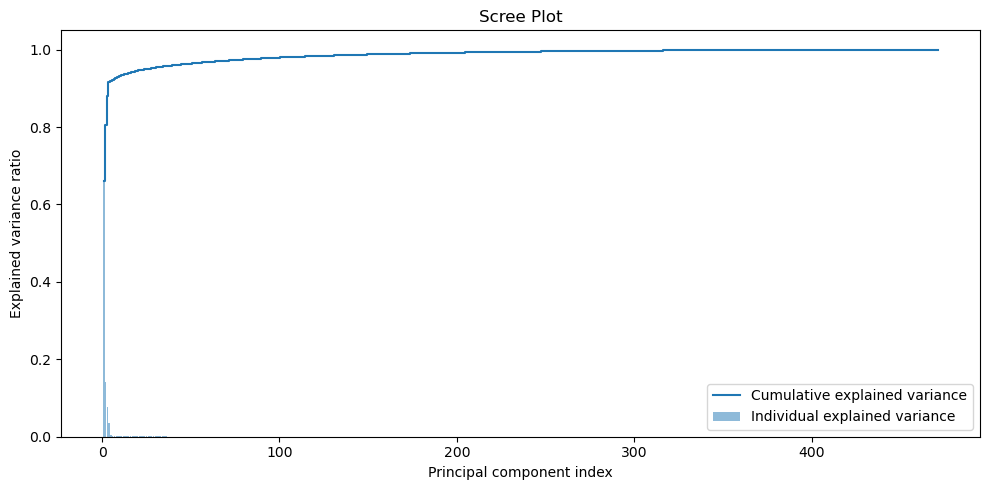

In [8]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Assuming 'log_returns_df' is your DataFrame with log returns calculated
# Make sure to drop any NaN values and the date column before performing PCA
log_returns_df = log_returns_df.dropna().iloc[:, 1:]

# Initialize PCA model
pca = PCA()

# Fit the PCA model on the log returns data
pca.fit(log_returns_df)

# Calculate the percentage of variance explained by each of the selected components
explained_variance = pca.explained_variance_ratio_

# Plotting the Scree plot
plt.figure(figsize=(10, 5))
plt.bar(range(1, len(explained_variance) + 1), explained_variance, alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(1, len(explained_variance) + 1), np.cumsum(explained_variance), where='mid', label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.title('Scree Plot')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

#A 3. Create a second plot showing cumulative variance retained if top N components are kept after dimensionality reduction (i.e. the horizontal axis will show the number of components kept, the vertical axis will show the cumulative percentage of variance retained).

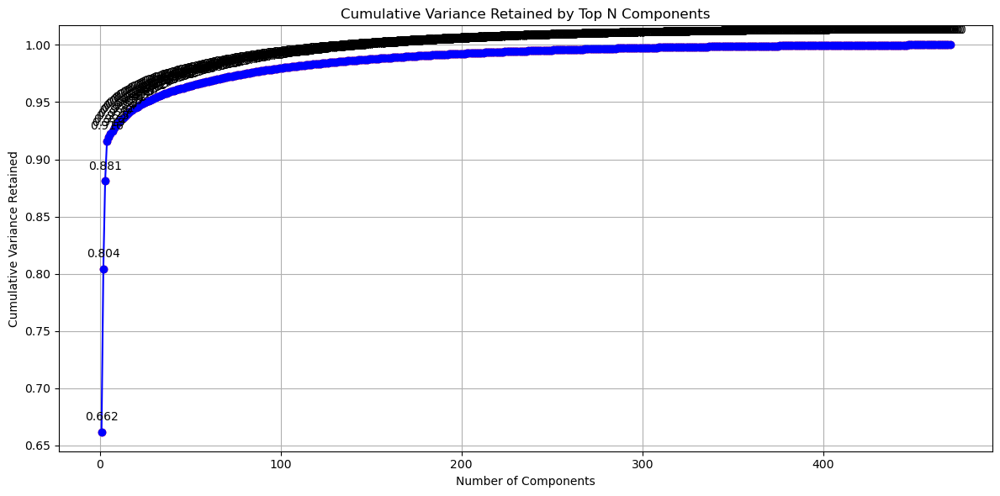

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Drop any rows with missing values if necessary
log_returns_df.dropna(inplace=True)

# Extract log returns for PCA
log_returns_values = log_returns_df.iloc[:, 1:].values  # Exclude date column for PCA

# Perform PCA
pca = PCA()
pca.fit(log_returns_values)

# Calculate the explained variance ratio and eigenvalues
explained_var_ratio = pca.explained_variance_ratio_

# Calculate cumulative variance retained
cumulative_var_ratio = np.cumsum(explained_var_ratio)

# Plot cumulative variance retained for top N components with numerical values
plt.figure(figsize=(12, 6))

plt.plot(range(1, len(cumulative_var_ratio) + 1), cumulative_var_ratio, marker='o', linestyle='-', color='blue')
plt.scatter(range(1, len(cumulative_var_ratio) + 1), cumulative_var_ratio, c='red', marker='o')

plt.xlabel('Number of Components')
plt.ylabel('Cumulative Variance Retained')
plt.title('Cumulative Variance Retained by Top N Components')
plt.grid(True)

# Display numerical values
for i, value in enumerate(cumulative_var_ratio, 1):
    plt.text(i, value + 0.01, f'{value:.3f}', ha='center', color='black')

plt.tight_layout()
plt.show()


#A 4.How many principal components must be retained in order to capture at least 80% of the total variance in data?


In [10]:
# Find the number of components needed to capture at least 80% of variance
n_components_80_percent = np.argmax(cumulative_var_ratio >= 0.8) + 1

print(f"Number of components to capture 80% of variance: {n_components_80_percent}")

Number of components to capture 80% of variance: 2


B. Analysis of principal components and weights

   1. Compute and plot the time series of the 1st principal component and observe temporal patterns. Identify the date with the lowest value for this component and conduct a quick research on the Internet to see if you can identify event(s) that might explain the observed behavior. 

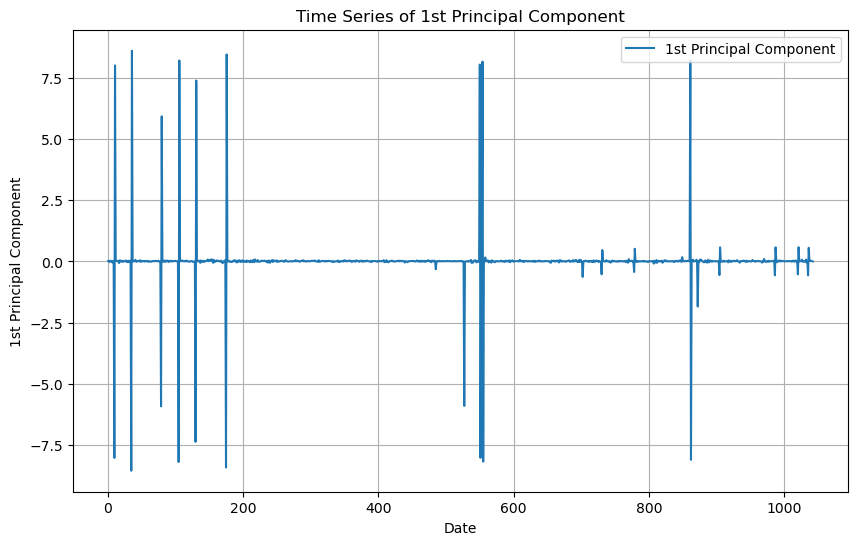

In [11]:
# b) 1.

import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Assuming you have already loaded and preprocessed the log returns data into 'log_returns_df'

# Extract log returns values for PCA
log_returns_values = log_returns_df.iloc[:, 1:].values  # Exclude date column for PCA

# Perform PCA
pca = PCA()
pca.fit(log_returns_values)

# Get the 1st principal component
first_principal_component = pca.components_[0]

# Transform log returns data using PCA to get the principal components
transformed_data = pca.transform(log_returns_values)

# Extract the 1st principal component time series
component_1_ts = transformed_data[:, 0]  # Time series of the 1st principal component

# Plot the time series of the 1st principal component
plt.figure(figsize=(10, 6))
plt.plot(log_returns_df.index, component_1_ts, label='1st Principal Component')
plt.xlabel('Date')
plt.ylabel('1st Principal Component')
plt.title('Time Series of 1st Principal Component')
plt.legend()
plt.grid(True)
plt.show()

2.Extract the weights from the PCA model for 1st and 2nd principal components. 

In [12]:
# b) 2.

# Extract log returns values for PCA
log_returns_values = log_returns_df.iloc[:, 1:].values  # Exclude date column for PCA

# Perform PCA
pca = PCA()
pca.fit(log_returns_values)

# Extract the weights for the 1st and 2nd principal components
weights_1st_pc = pca.components_[0]  # Weights of the 1st principal component
weights_2nd_pc = pca.components_[1]  # Weights of the 2nd principal component

# Create DataFrames to display the weights
weights_df_1st_2nd_pc = pd.DataFrame({'Stocks': log_returns_df.columns[1:], 
                                      '1st_PC_Weights': weights_1st_pc,
                                      '2nd_PC_Weights': weights_2nd_pc})

print(weights_df_1st_2nd_pc.head())  # Display the first few rows of weights for 1st and 2nd PCs

  Stocks  1st_PC_Weights  2nd_PC_Weights
0    ACE       -0.000424       -0.000912
1    ABT        0.000071       -0.000076
2    ANF       -0.000285        0.000186
3   ADBE       -0.000573       -0.000187
4    AMD        0.000048        0.000564


3.Create a plot to show weights of the 1st principal component grouped by the industry sector (for example, you may draw a bar plot of mean weight per sector). Observe the distribution of weights (magnitudes, signs). Based on your observation, what kind of information do you think the 1st principal component might have captured?

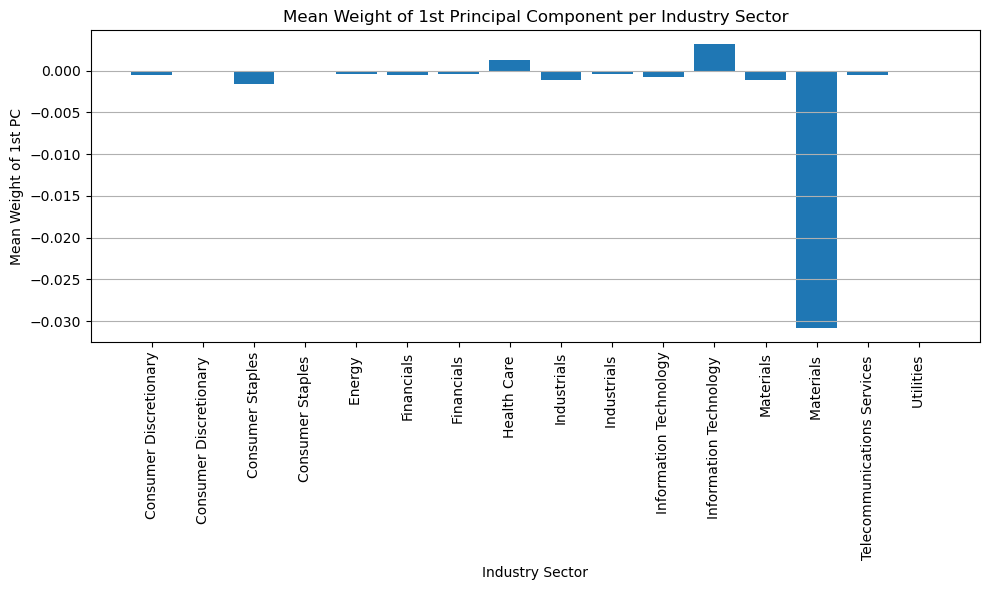

In [13]:
# Assuming 'log_returns_df' contains the log returns data
# Extract log returns values for PCA
log_returns_values = log_returns_df.iloc[:, 1:].values  # Exclude date column for PCA

# Perform PCA
pca = PCA()
pca.fit(log_returns_values)

# Extract the weights for the 1st principal component
weights_1st_pc = pca.components_[0]  # Weights of the 1st principal component

# Combine weights with sector information
weights_sector_df = pd.DataFrame({'Stocks': log_returns_df.columns[1:], 'Weights': weights_1st_pc})
weights_sector_df = pd.merge(weights_sector_df, ticker_df[['ticker', 'sector']], left_on='Stocks', right_on='ticker')

# Calculate mean weight per sector
mean_weights_per_sector = weights_sector_df.groupby('sector')['Weights'].mean().reset_index()

# Plot bar plot of mean weight per sector
plt.figure(figsize=(10, 6))
plt.bar(mean_weights_per_sector['sector'], mean_weights_per_sector['Weights'])
plt.xlabel('Industry Sector')
plt.ylabel('Mean Weight of 1st PC')
plt.title('Mean Weight of 1st Principal Component per Industry Sector')
plt.xticks(rotation=90)
plt.grid(axis='y')
plt.tight_layout()
plt.show()

4.Make a similar plot for the 2nd principal component.  What kind of information do you think does this component reveal?

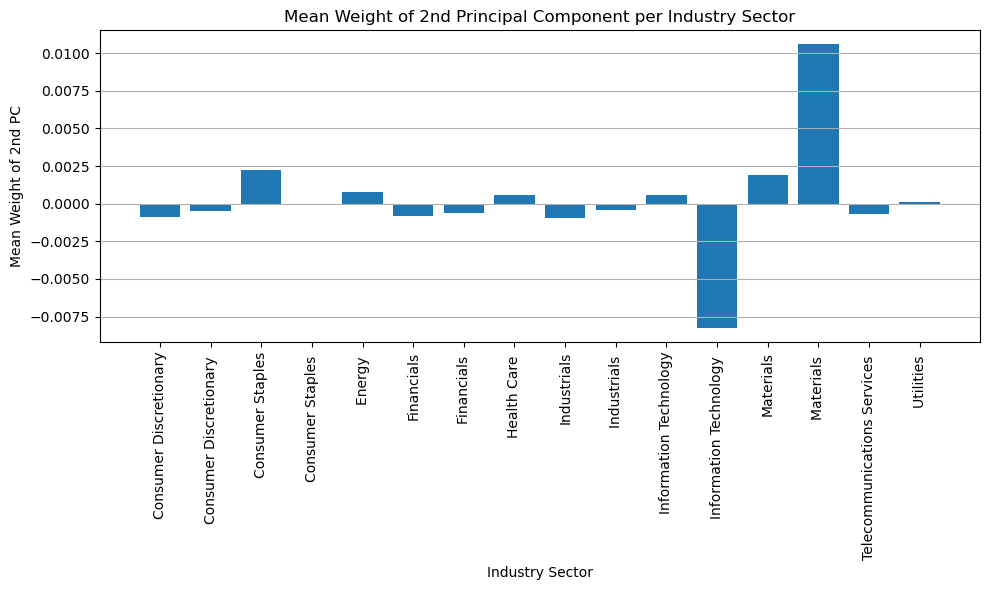

In [14]:
# Extract the weights for the 2nd principal component
weights_2nd_pc = pca.components_[1]  # Weights of the 2nd principal component

# Combine weights with sector information
weights_sector_df_2nd_pc = pd.DataFrame({'Stocks': log_returns_df.columns[1:], 'Weights': weights_2nd_pc})
weights_sector_df_2nd_pc = pd.merge(weights_sector_df_2nd_pc, ticker_df[['ticker', 'sector']], left_on='Stocks', right_on='ticker')

# Calculate mean weight per sector for the 2nd principal component
mean_weights_per_sector_2nd_pc = weights_sector_df_2nd_pc.groupby('sector')['Weights'].mean().reset_index()

# Plot bar plot of mean weight per sector for the 2nd principal component
plt.figure(figsize=(10, 6))
plt.bar(mean_weights_per_sector_2nd_pc['sector'], mean_weights_per_sector_2nd_pc['Weights'])
plt.xlabel('Industry Sector')
plt.ylabel('Mean Weight of 2nd PC')
plt.title('Mean Weight of 2nd Principal Component per Industry Sector')
plt.xticks(rotation=90)
plt.grid(axis='y')
plt.tight_layout()
plt.show()

5.Suppose we wanted to construct a new stock index using one principal component to track the overall market tendencies. Which of the two components would you prefer to use for this purpose, the 1st or the 2nd? Why?

In [15]:
import pandas as pd
from sklearn.decomposition import PCA

# Assuming 'log_returns_df' contains the log returns data
log_returns_values = log_returns_df.iloc[:, 1:].values  # Exclude date column for PCA

# Perform PCA
pca = PCA()
pca.fit(log_returns_values)

# Extract the weights for the 1st principal component
weights_pc1 = pca.components_[0]

# Combine weights with stock information
weights_stock_df = pd.DataFrame({'Stocks': log_returns_df.columns[1:], 'Weights': weights_pc1})

# Calculate the new stock index based on the 1st principal component
new_stock_index = (log_returns_values @ weights_pc1).reshape(-1, 1)

# Add the new stock index to the original DataFrame
log_returns_df['New_Index'] = new_stock_index

# Display the DataFrame with the new stock index
print(log_returns_df)


           MMM       ACE       ABT       ANF      ADBE       AMD       AES  \
1    -0.001384 -0.000643  0.009366 -0.031688  0.007006  0.034806  0.004773   
2     0.000000 -0.003382  0.000000 -0.015596  0.022282  0.015837  0.013402   
3    -0.006134 -0.004365 -0.002074 -0.033434  0.001551 -0.025001  0.017081   
4     0.001044 -0.007481  0.004143  0.000747 -0.007153  0.015982  0.000000   
5     0.010613 -0.013145 -0.008930  0.012429  0.028310  0.039961 -0.001541   
...        ...       ...       ...       ...       ...       ...       ...   
1038  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
1039 -0.004201  0.001550  0.003277  0.005686 -0.000937  0.000000  0.029256   
1040  0.002703  0.002235 -0.005467  0.016518 -0.007258  0.003766  0.010493   
1041 -0.005232 -0.001719  0.001972  0.002437 -0.013992 -0.011342 -0.024658   
1042 -0.009208 -0.012027 -0.014773 -0.004181 -0.005487  0.015095 -0.017993   

           AET       AFL         A  ...      WYNN       XEL    

The qualities and information recorded by each component influence the choice of the first and second primary components for generating a new stock index.

1st Principal Compnent (PC1): The first principal component represents the direction of largest variance in the data. It is frequently taken as an indicator of broader market movement or market tendencies. PC1 is expected to capture common factors affecting a wide range of stocks in the context of stock returns.

2nd Principal Component (PC2): PC2 represents the highest variance direction orthogonal to PC1. It captures variability that PC1 does not explain. PC2 may capture more particular or idiosyncratic characteristics that affect various groups of stocks differently in the context of stock returns.

PC1 is often preferred for constructing a new stock index that tracks overall market tendencies and general market movements. PC1 is intended to capture the most significant and common patterns in data, making it an appropriate choice for portraying the whole market.

However, the proportion of variance explained by each component must be considered. If PC1 explains a much greater fraction of total variation than PC2, the case for choosing PC1 becomes stronger. Furthermore, the interpretation of the weights assigned to particular stocks in PC1 should be scrutinized to ensure that they are consistent with expectations.

In conclusion, if PC1 captures a significant share of overall market movement and is easily interpretable in the context of stock returns, it would be the best alternative for developing a new stock index to track market tendencies.


# Problem 2 -BMI

In [16]:
import pandas as pd
data=pd.read_csv("C:/Users/jaswa/OneDrive/Desktop/733/Home Work 3/BMI.csv")

In [17]:
data.head()

,Age,Weight,Height,Neck,Chest,Abdomen,Hip,Thigh,Knee,Ankle,Biceps,Forearm,Wrist,fatpctg
0,22,160.8,62.4,34.0,95.8,87.9,99.2,59.6,38.9,24.0,28.8,25.2,16.6,25.3
1,22,170.6,80.5,38.5,93.6,83.0,98.7,58.7,37.3,23.4,30.5,28.9,18.2,6.1
2,23,153.9,69.3,36.2,93.1,85.2,94.5,59.0,37.3,21.9,32.0,27.4,17.1,12.3
3,23,157.1,70.4,35.5,92.1,77.1,93.9,56.1,36.1,22.7,30.5,27.2,18.2,9.4
4,23,196.5,88.6,38.0,96.6,85.3,102.5,59.1,37.6,23.2,31.8,29.7,18.3,10.3


In [18]:
data.tail()

,Age,Weight,Height,Neck,Chest,Abdomen,Hip,Thigh,Knee,Ankle,Biceps,Forearm,Wrist,fatpctg
247,72,194.4,74.9,38.9,111.1,111.5,101.7,60.3,37.3,21.5,31.3,27.2,18.0,29.3
248,72,195.1,70.2,38.9,108.3,101.3,97.8,56.0,41.6,22.7,30.5,29.4,19.8,26.0
249,72,199.5,76.7,40.9,108.5,105.0,104.5,59.6,40.8,23.2,35.2,28.6,20.1,33.6
250,74,217.0,65.1,40.8,112.4,108.5,107.1,59.3,42.2,24.6,33.7,30.0,20.9,31.9
251,81,161.7,76.9,37.8,96.4,95.4,99.3,53.5,37.5,21.5,31.4,26.8,18.3,21.5


In [19]:
data.shape

(252, 14)

In [20]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 252 entries, 0 to 251
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Age      252 non-null    int64  
 1   Weight   252 non-null    float64
 2   Height   252 non-null    float64
 3   Neck     252 non-null    float64
 4   Chest    252 non-null    float64
 5   Abdomen  252 non-null    float64
 6   Hip      252 non-null    float64
 7   Thigh    252 non-null    float64
 8   Knee     252 non-null    float64
 9   Ankle    252 non-null    float64
 10  Biceps   252 non-null    float64
 11  Forearm  252 non-null    float64
 12  Wrist    252 non-null    float64
 13  fatpctg  252 non-null    float64
dtypes: float64(13), int64(1)
memory usage: 27.7 KB


In [21]:
data.describe()

,Age,Weight,Height,Neck,Chest,Abdomen,Hip,Thigh,Knee,Ankle,Biceps,Forearm,Wrist,fatpctg
count,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000
mean,44.884921,181.497619,73.430159,37.992063,100.824206,92.555952,99.904762,59.405952,38.590476,23.102381,32.273413,28.663889,18.229762,19.150794
std,12.602040,30.438150,5.989882,2.430913,8.430476,10.783077,7.164058,5.249952,2.411805,1.694893,3.021274,2.020691,0.933585,8.368740
min,22.000000,116.000000,31.600000,31.100000,79.300000,69.400000,85.000000,47.200000,33.000000,19.100000,24.800000,21.000000,15.800000,0.000000
25%,35.750000,161.550000,69.675000,36.400000,94.350000,84.575000,95.500000,56.000000,36.975000,22.000000,30.200000,27.300000,17.600000,12.475000
50%,43.000000,178.400000,73.400000,38.000000,99.650000,90.950000,99.300000,59.000000,38.500000,22.800000,32.050000,28.700000,18.300000,19.200000
75%,54.000000,199.775000,77.350000,39.425000,105.375000,99.325000,103.525000,62.350000,39.925000,24.000000,34.325000,30.000000,18.800000,25.300000
max,81.000000,366.100000,89.400000,51.200000,136.200000,148.100000,147.700000,87.300000,49.100000,33.900000,45.000000,34.900000,21.400000,47.500000


In [22]:
!pip install pandas-profiling

  Using cached visions-0.7.4-py3-none-any.whl (102 kB)
  Attempting uninstall: visions
    Found existing installation: visions 0.7.5
    Uninstalling visions-0.7.5:
      Successfully uninstalled visions-0.7.5


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ydata-profiling 4.6.1 requires visions[type_image_path]==0.7.5, but you have visions 0.7.4 which is incompatible.


In [23]:
!pip install pandas ydata-profiling

  Using cached visions-0.7.5-py3-none-any.whl (102 kB)
  Attempting uninstall: visions
    Found existing installation: visions 0.7.4
    Uninstalling visions-0.7.4:
      Successfully uninstalled visions-0.7.4


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pandas-profiling 3.2.0 requires visions[type_image_path]==0.7.4, but you have visions 0.7.5 which is incompatible.


In [24]:
import pandas as pd
from ydata_profiling import ProfileReport
df = pd.read_csv("C:/Users/jaswa/OneDrive/Desktop/733/Home Work 3/BMI.csv")
profile = ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Selected features using Random Forest: Index(['Abdomen'], dtype='object')
Selected features using RFE: Index(['Neck', 'Abdomen', 'Hip', 'Biceps', 'Wrist'], dtype='object')
Selected features using Mutual Information: Index(['Weight', 'Neck', 'Chest', 'Abdomen', 'Hip', 'Thigh', 'Knee', 'Biceps'], dtype='object')


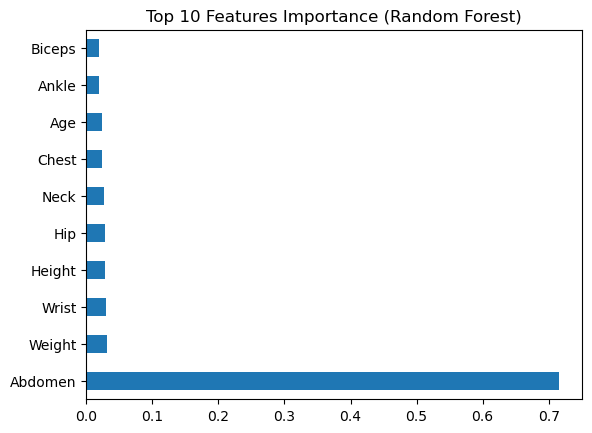

In [25]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import SelectFromModel
from sklearn.feature_selection import RFE
from sklearn.feature_selection import mutual_info_regression
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt

# Load the data
data_path = "C:\\Users\\jaswa\\OneDrive\\Desktop\\733\\Home Work 3\\BMI.csv"
data = pd.read_csv(data_path)

# Separate features and target variable
X = data.drop('fatpctg', axis=1)
y = data['fatpctg']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Method 1: Feature Importance from Tree-based models (e.g., Random Forest)
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Select features based on importance
sfm = SelectFromModel(rf_model, threshold=0.1)
sfm.fit(X_train, y_train)
selected_features_rf = X_train.columns[sfm.get_support()]

# Method 2: Recursive Feature Elimination (RFE)
lr_model = LinearRegression()
rfe = RFE(lr_model, n_features_to_select=5)
rfe.fit(X_train, y_train)
selected_features_rfe = X_train.columns[rfe.ranking_ == 1]

# Method 3: Mutual Information
mi_scores = mutual_info_regression(X_train, y_train)
selected_features_mi = X_train.columns[mi_scores > 0.1]

# Print the selected features from each method
print("Selected features using Random Forest:", selected_features_rf)
print("Selected features using RFE:", selected_features_rfe)
print("Selected features using Mutual Information:", selected_features_mi)

# Visualize feature importances from Random Forest
feat_importances = pd.Series(rf_model.feature_importances_, index=X.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.title('Top 10 Features Importance (Random Forest)')
plt.show()


A) Wrapper Method : Search for the best set of features using backward and forward stepwise regression


In [26]:
import pandas as pd
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import numpy as np

# Load the data
data_path = "C:\\Users\\jaswa\\OneDrive\\Desktop\\733\\Home Work 3\\BMI.csv"
data = pd.read_csv(data_path)

# Separate features and target variable
X = data.drop('fatpctg', axis=1)
y = data['fatpctg']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Add a constant to the features for the statsmodels regression
X_train = sm.add_constant(X_train)
X_test = sm.add_constant(X_test)

# Backward Stepwise Regression
def backward_stepwise_selection(X, y):
    features = X.columns.tolist()
    while len(features) > 0:
        X_temp = X[features]
        model = sm.OLS(y, X_temp).fit()
        max_p_value = max(model.pvalues)
        if max_p_value > 0.05:  # Adjust the significance level as needed
            excluded_feature = model.pvalues.idxmax()
            features.remove(excluded_feature)
        else:
            break
    return features

selected_features_backward = backward_stepwise_selection(X_train, y_train)
print("Selected features using Backward Stepwise Regression:", selected_features_backward)

# Forward Stepwise Regression
def forward_stepwise_selection(X, y):
    features = []
    while True:
        remaining_features = [feature for feature in X.columns if feature not in features]
        if len(remaining_features) == 0:
            break
        best_pvalue = np.inf
        best_feature = None
        for feature in remaining_features:
            X_temp = X[features + [feature]]
            model = sm.OLS(y, X_temp).fit()
            p_value = model.pvalues[-1]
            if p_value < best_pvalue:
                best_pvalue = p_value
                best_feature = feature
        if best_pvalue < 0.05:  # Adjust the significance level as needed
            features.append(best_feature)
        else:
            break
    return features

selected_features_forward = forward_stepwise_selection(X_train, y_train)
print("Selected features using Forward Stepwise Regression:", selected_features_forward)


Selected features using Backward Stepwise Regression: ['const', 'Weight', 'Abdomen', 'Wrist']
Selected features using Forward Stepwise Regression: ['Abdomen', 'Wrist', 'Age', 'Height']


B) Filter Method: Output a ranking of features using correlation statistics (i.e. between any of the input variables and output) 

In [27]:
import pandas as pd

# Load the data
data_path = "C:\\Users\\jaswa\\OneDrive\\Desktop\\733\\Home Work 3\\BMI.csv"
data = pd.read_csv(data_path)

# Separate features and target variable
X = data.drop('fatpctg', axis=1)
y = data['fatpctg']

# Calculate correlation between each feature and the target variable
correlation_with_target = X.apply(lambda x: x.corr(y))

# Sort features based on absolute correlation values
feature_ranking = correlation_with_target.abs().sort_values(ascending=False)

# Print the feature rankings
print("Feature Rankings based on Correlation with Target:")
print(feature_ranking)


Feature Rankings based on Correlation with Target:
Abdomen    0.813432
Chest      0.702620
Hip        0.625201
Weight     0.612925
Thigh      0.559608
Knee       0.508665
Biceps     0.493271
Neck       0.490592
Forearm    0.361387
Wrist      0.346575
Age        0.291458
Ankle      0.265970
Height     0.133211
dtype: float64


C)Embedded Method

1.Lasso Regression

In [28]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler

# Load the data
data_path = "C:\\Users\\jaswa\\OneDrive\\Desktop\\733\\Home Work 3\\BMI.csv"
data = pd.read_csv(data_path)

# Separate features and target variable
X = data.drop('fatpctg', axis=1)
y = data['fatpctg']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Fit Lasso Regression model
lasso_model = Lasso(alpha=0.1)  # You can adjust the alpha parameter
lasso_model.fit(X_train_scaled, y_train)

# Get selected features based on non-zero coefficients
selected_features_lasso = X.columns[lasso_model.coef_ != 0]

# Print the selected features from Lasso Regression
print("Selected features using Lasso Regression:", selected_features_lasso)


Selected features using Lasso Regression: Index(['Age', 'Weight', 'Height', 'Neck', 'Abdomen', 'Thigh', 'Biceps',
       'Forearm', 'Wrist'],
      dtype='object')


2.Random Forest(Importance)

In [29]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt

# Load the data
data_path = "C:\\Users\\jaswa\\OneDrive\\Desktop\\733\\Home Work 3\\BMI.csv"
data = pd.read_csv(data_path)

# Separate features and target variable
X = data.drop('fatpctg', axis=1)
y = data['fatpctg']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit Random Forest model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Get feature importances
feature_importances = rf_model.feature_importances_

# Create a DataFrame with feature names and their importances
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})

# Sort features based on importance
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Print the feature importance ranking
print("Feature Importance Ranking (Random Forest):")
print(feature_importance_df)


Feature Importance Ranking (Random Forest):
    Feature  Importance
5   Abdomen    0.714957
1    Weight    0.031164
12    Wrist    0.030504
2    Height    0.029040
6       Hip    0.028463
3      Neck    0.026902
4     Chest    0.024049
0       Age    0.023840
9     Ankle    0.019951
10   Biceps    0.019619
8      Knee    0.019410
11  Forearm    0.016606
7     Thigh    0.015493
